# AIPI 590 - XAI | Assignment #5
### Adversarial Patches
### Anish Parmar

Majority of the code (imports, initialization, etc.) was pulled from here: https://github.com/AIPI-590-XAI/Duke-AI-XAI/blob/main/adversarial-ai-example-notebooks/adversarial_attacks_patches.ipynb

The above source is from the class Github repository.

Two small code snippets related to printing the patches was produced with AI assistance. The citations are above the code snippets.



[![Open In Collab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/anishParmar9778/DukeXAI/blob/main/HW5/AIPI_590_adversarial_patches.ipynb)

## **Setup From Class Github**

In [1]:
## Standard libraries
import os
import json
import math
import time
import numpy as np
import scipy.linalg

## Imports for plotting
import matplotlib.pyplot as plt
%matplotlib inline
from IPython.display import set_matplotlib_formats
set_matplotlib_formats('svg', 'pdf') # For export
from matplotlib.colors import to_rgb
import matplotlib
matplotlib.rcParams['lines.linewidth'] = 2.0
import seaborn as sns
sns.set()

## Progress bar
from tqdm.notebook import tqdm

## PyTorch
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.utils.data as data
import torch.optim as optim
# Torchvision
import torchvision
from torchvision.datasets import CIFAR10
from torchvision import transforms
# PyTorch Lightning
try:
    import pytorch_lightning as pl
except ModuleNotFoundError: # Google Colab does not have PyTorch Lightning installed by default. Hence, we do it here if necessary
    !pip install --quiet pytorch-lightning>=1.4
    import pytorch_lightning as pl
from pytorch_lightning.callbacks import LearningRateMonitor, ModelCheckpoint

# Path to the folder where the datasets are/should be downloaded (e.g. MNIST)
DATASET_PATH = "../data"
# Path to the folder where the pretrained models are saved
CHECKPOINT_PATH = "../saved_models/tutorial10"

# Setting the seed
pl.seed_everything(42)

# Ensure that all operations are deterministic on GPU (if used) for reproducibility
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

# Fetching the device that will be used throughout this notebook
device = torch.device("cpu") if not torch.cuda.is_available() else torch.device("cuda:0")
print("Using device", device)

/tmp/ipython-input-1779675758.py:13: DeprecationWarning: `set_matplotlib_formats` is deprecated since IPython 7.23, directly use `matplotlib_inline.backend_inline.set_matplotlib_formats()`
  set_matplotlib_formats('svg', 'pdf') # For export
INFO:lightning_fabric.utilities.seed:Seed set to 42


Using device cuda:0


In [2]:
import urllib.request
from urllib.error import HTTPError
import zipfile
# Github URL where the dataset is stored for this tutorial
base_url = "https://raw.githubusercontent.com/phlippe/saved_models/main/tutorial10/"
# Files to download
pretrained_files = [(DATASET_PATH, "TinyImageNet.zip"), (CHECKPOINT_PATH, "patches.zip")]
# Create checkpoint path if it doesn't exist yet
os.makedirs(DATASET_PATH, exist_ok=True)
os.makedirs(CHECKPOINT_PATH, exist_ok=True)

# For each file, check whether it already exists. If not, try downloading it.
for dir_name, file_name in pretrained_files:
    file_path = os.path.join(dir_name, file_name)
    if not os.path.isfile(file_path):
        file_url = base_url + file_name
        print(f"Downloading {file_url}...")
        try:
            urllib.request.urlretrieve(file_url, file_path)
        except HTTPError as e:
            print("Something went wrong. Please try to download the file from the GDrive folder, or contact the author with the full output including the following error:\n", e)
        if file_name.endswith(".zip"):
            print("Unzipping file...")
            with zipfile.ZipFile(file_path, 'r') as zip_ref:
                zip_ref.extractall(file_path.rsplit("/",1)[0])

Unzipping file...
Unzipping file...


In [3]:
# Load CNN architecture pretrained on ImageNet
os.environ["TORCH_HOME"] = CHECKPOINT_PATH
pretrained_model = torchvision.models.resnet34(weights='IMAGENET1K_V1')
pretrained_model = pretrained_model.to(device)

# No gradients needed for the network
pretrained_model.eval()
for p in pretrained_model.parameters():
    p.requires_grad = False

Downloading: "https://download.pytorch.org/models/resnet34-b627a593.pth" to ../saved_models/tutorial10/hub/checkpoints/resnet34-b627a593.pth


100%|██████████| 83.3M/83.3M [00:00<00:00, 221MB/s]


In [4]:
# Mean and Std from ImageNet
NORM_MEAN = np.array([0.485, 0.456, 0.406])
NORM_STD = np.array([0.229, 0.224, 0.225])
# No resizing and center crop necessary as images are already preprocessed.
plain_transforms = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=NORM_MEAN,
                         std=NORM_STD)
])

# Load dataset and create data loader
imagenet_path = os.path.join(DATASET_PATH, "TinyImageNet/")
assert os.path.isdir(imagenet_path), f"Could not find the ImageNet dataset at expected path \"{imagenet_path}\". " + \
                                     f"Please make sure to have downloaded the ImageNet dataset here, or change the {DATASET_PATH=} variable."
dataset = torchvision.datasets.ImageFolder(root=imagenet_path, transform=plain_transforms)
data_loader = data.DataLoader(dataset, batch_size=32, shuffle=False, drop_last=False, num_workers=8)

# Load label names to interpret the label numbers 0 to 999
with open(os.path.join(imagenet_path, "label_list.json"), "r") as f:
    label_names = json.load(f)

def get_label_index(lab_str):
    assert lab_str in label_names, f"Label \"{lab_str}\" not found. Check the spelling of the class."
    return label_names.index(lab_str)

/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:627: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


In [5]:
def eval_model(dataset_loader, img_func=None):
    tp, tp_5, counter = 0., 0., 0.
    for imgs, labels in tqdm(dataset_loader, desc="Validating..."):
        imgs = imgs.to(device)
        labels = labels.to(device)
        if img_func is not None:
            imgs = img_func(imgs, labels)
        with torch.no_grad():
            preds = pretrained_model(imgs)
        tp += (preds.argmax(dim=-1) == labels).sum()
        tp_5 += (preds.topk(5, dim=-1)[1] == labels[...,None]).any(dim=-1).sum()
        counter += preds.shape[0]
    acc = tp.float().item()/counter
    top5 = tp_5.float().item()/counter
    print(f"Top-1 error: {(100.0 * (1 - acc)):4.2f}%")
    print(f"Top-5 error: {(100.0 * (1 - top5)):4.2f}%")
    return acc, top5

In [6]:
_ = eval_model(data_loader)

Validating...:   0%|          | 0/157 [00:00<?, ?it/s]

Top-1 error: 19.38%
Top-5 error: 4.38%


In [7]:
def show_prediction(img, label, pred, K=5, adv_img=None, noise=None):

    if isinstance(img, torch.Tensor):
        # Tensor image to numpy
        img = img.cpu().permute(1, 2, 0).numpy()
        img = (img * NORM_STD[None,None]) + NORM_MEAN[None,None]
        img = np.clip(img, a_min=0.0, a_max=1.0)
        label = label.item()

    # Plot on the left the image with the true label as title.
    # On the right, have a horizontal bar plot with the top k predictions including probabilities
    if noise is None or adv_img is None:
        fig, ax = plt.subplots(1, 2, figsize=(10,2), gridspec_kw={'width_ratios': [1, 1]})
    else:
        fig, ax = plt.subplots(1, 5, figsize=(12,2), gridspec_kw={'width_ratios': [1, 1, 1, 1, 2]})

    ax[0].imshow(img)
    ax[0].set_title(label_names[label])
    ax[0].axis('off')

    if adv_img is not None and noise is not None:
        # Visualize adversarial images
        adv_img = adv_img.cpu().permute(1, 2, 0).numpy()
        adv_img = (adv_img * NORM_STD[None,None]) + NORM_MEAN[None,None]
        adv_img = np.clip(adv_img, a_min=0.0, a_max=1.0)
        ax[1].imshow(adv_img)
        ax[1].set_title('Adversarial')
        ax[1].axis('off')
        # Visualize noise
        noise = noise.cpu().permute(1, 2, 0).numpy()
        noise = noise * 0.5 + 0.5 # Scale between 0 to 1
        ax[2].imshow(noise)
        ax[2].set_title('Noise')
        ax[2].axis('off')
        # buffer
        ax[3].axis('off')

    if abs(pred.sum().item() - 1.0) > 1e-4:
        pred = torch.softmax(pred, dim=-1)
    topk_vals, topk_idx = pred.topk(K, dim=-1)
    topk_vals, topk_idx = topk_vals.cpu().numpy(), topk_idx.cpu().numpy()
    ax[-1].barh(np.arange(K), topk_vals*100.0, align='center', color=["C0" if topk_idx[i]!=label else "C2" for i in range(K)])
    ax[-1].set_yticks(np.arange(K))
    ax[-1].set_yticklabels([label_names[c] for c in topk_idx])
    ax[-1].invert_yaxis()
    ax[-1].set_xlabel('Confidence')
    ax[-1].set_title('Predictions')

    plt.show()
    plt.close()

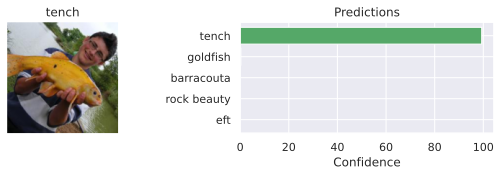

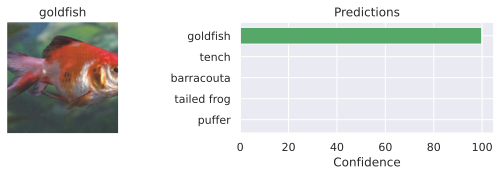

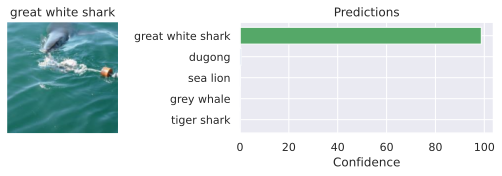

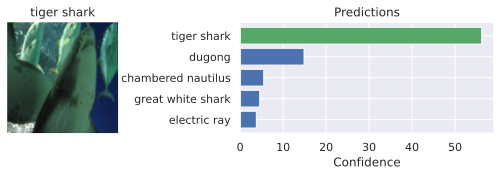

In [8]:
exmp_batch, label_batch = next(iter(data_loader))
with torch.no_grad():
    preds = pretrained_model(exmp_batch.to(device))
for i in range(1,17,5):
    show_prediction(exmp_batch[i], label_batch[i], preds[i])

## **Patch Generation**

In [9]:
def place_patch(img, patch):
    for i in range(img.shape[0]):
        h_offset = np.random.randint(0,img.shape[2]-patch.shape[1]-1)
        w_offset = np.random.randint(0,img.shape[3]-patch.shape[2]-1)
        img[i,:,h_offset:h_offset+patch.shape[1],w_offset:w_offset+patch.shape[2]] = patch_forward(patch)
    return img

In [10]:
TENSOR_MEANS, TENSOR_STD = torch.FloatTensor(NORM_MEAN)[:,None,None], torch.FloatTensor(NORM_STD)[:,None,None]
def patch_forward(patch):
    # Map patch values from [-infty,infty] to ImageNet min and max
    patch = (torch.tanh(patch) + 1 - 2 * TENSOR_MEANS) / (2 * TENSOR_STD)
    return patch

In [11]:
def eval_patch(model, patch, val_loader, target_class):
    model.eval()
    tp, tp_5, counter = 0., 0., 0.
    with torch.no_grad():
        for img, img_labels in tqdm(val_loader, desc="Validating...", leave=False):
            # For stability, place the patch at 4 random locations per image, and average the performance
            for _ in range(4):
                patch_img = place_patch(img, patch)
                patch_img = patch_img.to(device)
                img_labels = img_labels.to(device)
                pred = model(patch_img)
                # In the accuracy calculation, we need to exclude the images that are of our target class
                # as we would not "fool" the model into predicting those
                tp += torch.logical_and(pred.argmax(dim=-1) == target_class, img_labels != target_class).sum()
                tp_5 += torch.logical_and((pred.topk(5, dim=-1)[1] == target_class).any(dim=-1), img_labels != target_class).sum()
                counter += (img_labels != target_class).sum()
    acc = tp/counter
    top5 = tp_5/counter
    return acc, top5

In [12]:
def patch_attack(model, target_class, patch_size=64, num_epochs=5):
    # Leave a small set of images out to check generalization
    # In most of our experiments, the performance on the hold-out data points
    # was as good as on the training set. Overfitting was little possible due
    # to the small size of the patches.
    train_set, val_set = torch.utils.data.random_split(dataset, [4500, 500])
    train_loader = data.DataLoader(train_set, batch_size=32, shuffle=True, drop_last=True, num_workers=8)
    val_loader = data.DataLoader(val_set, batch_size=32, shuffle=False, drop_last=False, num_workers=4)

    # Create parameter and optimizer
    if not isinstance(patch_size, tuple):
        patch_size = (patch_size, patch_size)
    patch = nn.Parameter(torch.zeros(3, patch_size[0], patch_size[1]), requires_grad=True)
    optimizer = torch.optim.SGD([patch], lr=1e-1, momentum=0.8)
    loss_module = nn.CrossEntropyLoss()

    # Training loop
    for epoch in range(num_epochs):
        t = tqdm(train_loader, leave=False)
        for img, _ in t:
            img = place_patch(img, patch)
            img = img.to(device)
            pred = model(img)
            labels = torch.zeros(img.shape[0], device=pred.device, dtype=torch.long).fill_(target_class)
            loss = loss_module(pred, labels)
            optimizer.zero_grad()
            loss.mean().backward()
            optimizer.step()
            t.set_description(f"Epoch {epoch}, Loss: {loss.item():4.2f}")

    # Final validation
    acc, top5 = eval_patch(model, patch, val_loader, target_class)

    return patch.data, {"acc": acc.item(), "top5": top5.item()}

In [13]:
# Load evaluation results of the pretrained patches
json_results_file = os.path.join(CHECKPOINT_PATH, "patch_results.json")
json_results = {}
if os.path.isfile(json_results_file):
    with open(json_results_file, "r") as f:
        json_results = json.load(f)

# If you train new patches, you can save the results via calling this function
def save_results(patch_dict):
    result_dict = {cname: {psize: [t.item() if isinstance(t, torch.Tensor) else t
                                   for t in patch_dict[cname][psize]["results"]]
                           for psize in patch_dict[cname]}
                   for cname in patch_dict}
    with open(os.path.join(CHECKPOINT_PATH, "patch_results.json"), "w") as f:
        json.dump(result_dict, f, indent=4)

In [14]:
def get_patches(class_names, patch_sizes):
    result_dict = dict()

    # Loop over all classes and patch sizes
    for name in class_names:
        result_dict[name] = dict()
        for patch_size in patch_sizes:
            c = label_names.index(name)
            file_name = os.path.join(CHECKPOINT_PATH, f"{name}_{patch_size}_patch.pt")
            # Load patch if pretrained file exists, otherwise start training
            if not os.path.isfile(file_name):
                patch, val_results = patch_attack(pretrained_model, target_class=c, patch_size=patch_size, num_epochs=5)
                print(f"Validation results for {name} and {patch_size}:", val_results)
                torch.save(patch, file_name)
            else:
                patch = torch.load(file_name)
            # Load evaluation results if exist, otherwise manually evaluate the patch
            if name in json_results:
                results = json_results[name][str(patch_size)]
            else:
                results = eval_patch(pretrained_model, patch, data_loader, target_class=c)

            # Store results and the patches in a dict for better access
            result_dict[name][patch_size] = {
                "results": results,
                "patch": patch
            }

    return result_dict

## **Patch Evaluation**

In addition to the 5 provided classes, I tested warplane, tennis ball, soccer ball, and basketball. I observed that classes with a distinctive pattern and/or color were much more likely to fool the model (pineapple, tennis ball, soccer ball). And of course when the size was largest (64) the patch was more effective.

In [15]:
class_names = ['toaster', 'goldfish', 'school bus', 'lipstick', 'pineapple', 'soccer ball', 'tennis ball']
patch_sizes = [32, 48, 64]

patch_dict = get_patches(class_names, patch_sizes)
save_results(patch_dict) # Uncomment if you add new class names and want to save the new results

/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:627: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:627: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


  0%|          | 0/140 [00:00<?, ?it/s]

  0%|          | 0/140 [00:00<?, ?it/s]

  0%|          | 0/140 [00:00<?, ?it/s]

  0%|          | 0/140 [00:00<?, ?it/s]

  0%|          | 0/140 [00:00<?, ?it/s]

Validating...:   0%|          | 0/16 [00:00<?, ?it/s]

Validation results for soccer ball and 32: {'acc': 0.862500011920929, 'top5': 0.9704999923706055}


Validating...:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/140 [00:00<?, ?it/s]

  0%|          | 0/140 [00:00<?, ?it/s]

  0%|          | 0/140 [00:00<?, ?it/s]

  0%|          | 0/140 [00:00<?, ?it/s]

  0%|          | 0/140 [00:00<?, ?it/s]

Validating...:   0%|          | 0/16 [00:00<?, ?it/s]

Validation results for soccer ball and 48: {'acc': 0.9564999938011169, 'top5': 0.996999979019165}


Validating...:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/140 [00:00<?, ?it/s]

  0%|          | 0/140 [00:00<?, ?it/s]

  0%|          | 0/140 [00:00<?, ?it/s]

  0%|          | 0/140 [00:00<?, ?it/s]

  0%|          | 0/140 [00:00<?, ?it/s]

Validating...:   0%|          | 0/16 [00:00<?, ?it/s]

Validation results for soccer ball and 64: {'acc': 0.9914658665657043, 'top5': 1.0}


Validating...:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/140 [00:00<?, ?it/s]

  0%|          | 0/140 [00:00<?, ?it/s]

  0%|          | 0/140 [00:00<?, ?it/s]

  0%|          | 0/140 [00:00<?, ?it/s]

  0%|          | 0/140 [00:00<?, ?it/s]

Validating...:   0%|          | 0/16 [00:00<?, ?it/s]

Validation results for tennis ball and 32: {'acc': 0.7555110454559326, 'top5': 0.9143286347389221}


Validating...:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/140 [00:00<?, ?it/s]

  0%|          | 0/140 [00:00<?, ?it/s]

  0%|          | 0/140 [00:00<?, ?it/s]

  0%|          | 0/140 [00:00<?, ?it/s]

  0%|          | 0/140 [00:00<?, ?it/s]

Validating...:   0%|          | 0/16 [00:00<?, ?it/s]

Validation results for tennis ball and 48: {'acc': 0.926706850528717, 'top5': 0.9959839582443237}


Validating...:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/140 [00:00<?, ?it/s]

  0%|          | 0/140 [00:00<?, ?it/s]

  0%|          | 0/140 [00:00<?, ?it/s]

  0%|          | 0/140 [00:00<?, ?it/s]

  0%|          | 0/140 [00:00<?, ?it/s]

Validating...:   0%|          | 0/16 [00:00<?, ?it/s]

Validation results for tennis ball and 64: {'acc': 0.9785000085830688, 'top5': 0.9980000257492065}


Validating...:   0%|          | 0/157 [00:00<?, ?it/s]

In [ ]:
class_names = ['toaster', 'goldfish', 'school bus', 'lipstick', 'pineapple', 'warplane', 'tennis ball', 'soccer ball', 'basketball']
patch_sizes = [32, 48, 64]

patch_dict = get_patches(class_names, patch_sizes)
save_results(patch_dict) # Uncomment if you add new class names and want to save the new results

Validating...:   0%|          | 0/157 [00:00<?, ?it/s]

/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:627: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


Validating...:   0%|          | 0/157 [00:00<?, ?it/s]

Validating...:   0%|          | 0/157 [00:00<?, ?it/s]

/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:627: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


  0%|          | 0/140 [00:00<?, ?it/s]

  0%|          | 0/140 [00:00<?, ?it/s]

  0%|          | 0/140 [00:00<?, ?it/s]

  0%|          | 0/140 [00:00<?, ?it/s]

  0%|          | 0/140 [00:00<?, ?it/s]

Validating...:   0%|          | 0/16 [00:00<?, ?it/s]

Validation results for tennis ball and 32: {'acc': 0.8234999775886536, 'top5': 0.953000009059906}


Validating...:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/140 [00:00<?, ?it/s]

  0%|          | 0/140 [00:00<?, ?it/s]

  0%|          | 0/140 [00:00<?, ?it/s]

  0%|          | 0/140 [00:00<?, ?it/s]

  0%|          | 0/140 [00:00<?, ?it/s]

Validating...:   0%|          | 0/16 [00:00<?, ?it/s]

Validation results for tennis ball and 48: {'acc': 0.9580000042915344, 'top5': 0.9980000257492065}


Validating...:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/140 [00:00<?, ?it/s]

  0%|          | 0/140 [00:00<?, ?it/s]

  0%|          | 0/140 [00:00<?, ?it/s]

  0%|          | 0/140 [00:00<?, ?it/s]

  0%|          | 0/140 [00:00<?, ?it/s]

Validating...:   0%|          | 0/16 [00:00<?, ?it/s]

Validation results for tennis ball and 64: {'acc': 0.9889779686927795, 'top5': 0.9994990229606628}


Validating...:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/140 [00:00<?, ?it/s]

  0%|          | 0/140 [00:00<?, ?it/s]

  0%|          | 0/140 [00:00<?, ?it/s]

  0%|          | 0/140 [00:00<?, ?it/s]

  0%|          | 0/140 [00:00<?, ?it/s]

Validating...:   0%|          | 0/16 [00:00<?, ?it/s]

Validation results for soccer ball and 32: {'acc': 0.8464999794960022, 'top5': 0.9674999713897705}


Validating...:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/140 [00:00<?, ?it/s]

  0%|          | 0/140 [00:00<?, ?it/s]

  0%|          | 0/140 [00:00<?, ?it/s]

  0%|          | 0/140 [00:00<?, ?it/s]

  0%|          | 0/140 [00:00<?, ?it/s]

Validating...:   0%|          | 0/16 [00:00<?, ?it/s]

Validation results for soccer ball and 48: {'acc': 0.9719439148902893, 'top5': 0.9984970092773438}


Validating...:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/140 [00:00<?, ?it/s]

  0%|          | 0/140 [00:00<?, ?it/s]

  0%|          | 0/140 [00:00<?, ?it/s]

  0%|          | 0/140 [00:00<?, ?it/s]

  0%|          | 0/140 [00:00<?, ?it/s]

Validating...:   0%|          | 0/16 [00:00<?, ?it/s]

Validation results for soccer ball and 64: {'acc': 0.9925000071525574, 'top5': 1.0}


Validating...:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/140 [00:00<?, ?it/s]

  0%|          | 0/140 [00:00<?, ?it/s]

  0%|          | 0/140 [00:00<?, ?it/s]

  0%|          | 0/140 [00:00<?, ?it/s]

  0%|          | 0/140 [00:00<?, ?it/s]

Validating...:   0%|          | 0/16 [00:00<?, ?it/s]

Validation results for basketball and 32: {'acc': 0.7995991706848145, 'top5': 0.9383767247200012}


Validating...:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/140 [00:00<?, ?it/s]

  0%|          | 0/140 [00:00<?, ?it/s]

  0%|          | 0/140 [00:00<?, ?it/s]

  0%|          | 0/140 [00:00<?, ?it/s]

  0%|          | 0/140 [00:00<?, ?it/s]

Validating...:   0%|          | 0/16 [00:00<?, ?it/s]

Validation results for basketball and 48: {'acc': 0.9503012299537659, 'top5': 0.9939758777618408}


Validating...:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/140 [00:00<?, ?it/s]

  0%|          | 0/140 [00:00<?, ?it/s]

  0%|          | 0/140 [00:00<?, ?it/s]

  0%|          | 0/140 [00:00<?, ?it/s]

  0%|          | 0/140 [00:00<?, ?it/s]

Validating...:   0%|          | 0/16 [00:00<?, ?it/s]

Validation results for basketball and 64: {'acc': 0.9759519100189209, 'top5': 0.9979959726333618}


Validating...:   0%|          | 0/157 [00:00<?, ?it/s]

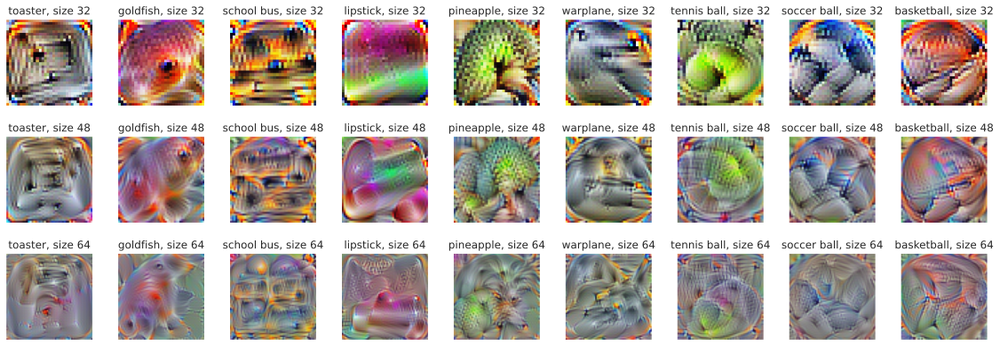

In [ ]:
def show_patches():
    fig, ax = plt.subplots(len(patch_sizes), len(class_names), figsize=(len(class_names)*2.2, len(patch_sizes)*2.2))
    for c_idx, cname in enumerate(class_names):
        for p_idx, psize in enumerate(patch_sizes):
            patch = patch_dict[cname][psize]["patch"]
            patch = (torch.tanh(patch) + 1) / 2 # Parameter to pixel values
            patch = patch.cpu().permute(1, 2, 0).numpy()
            patch = np.clip(patch, a_min=0.0, a_max=1.0)
            ax[p_idx][c_idx].imshow(patch)
            ax[p_idx][c_idx].set_title(f"{cname}, size {psize}")
            ax[p_idx][c_idx].axis('off')
    fig.subplots_adjust(hspace=0.3, wspace=0.3)
    plt.show()
show_patches()

In [ ]:
%%html
<!-- Some HTML code to increase font size in the following table -->
<style>
th {font-size: 120%;}
td {font-size: 120%;}
</style>

In [ ]:
import tabulate
from IPython.display import display, HTML

def show_table(top_1=True):
    i = 0 if top_1 else 1
    table = [[name] + [f"{(100.0 * patch_dict[name][psize]['results'][i]):4.2f}%" for psize in patch_sizes]
             for name in class_names]
    display(HTML(tabulate.tabulate(table, tablefmt='html', headers=["Class name"] + [f"Patch size {psize}x{psize}" for psize in patch_sizes])))

In [ ]:
show_table(top_1=True)

Class name,Patch size 32x32,Patch size 48x48,Patch size 64x64
toaster,48.89%,90.48%,98.58%
goldfish,69.53%,93.53%,98.34%
school bus,78.79%,93.95%,98.22%
lipstick,43.36%,86.05%,96.41%
pineapple,79.74%,94.48%,98.72%
warplane,31.81%,81.20%,95.77%
tennis ball,81.60%,95.85%,98.65%
soccer ball,85.21%,96.98%,99.06%
basketball,80.59%,94.82%,97.78%


In [ ]:
show_table(top_1=False)

Class name,Patch size 32x32,Patch size 48x48,Patch size 64x64
toaster,72.02%,98.12%,99.93%
goldfish,86.31%,99.07%,99.95%
school bus,91.64%,99.15%,99.89%
lipstick,70.10%,96.86%,99.73%
pineapple,92.23%,99.26%,99.96%
warplane,59.72%,93.61%,99.58%
tennis ball,95.53%,99.78%,99.97%
soccer ball,96.56%,99.78%,99.97%
basketball,93.26%,99.38%,99.84%


In [16]:
def perform_patch_attack(patch):
    patch_batch = exmp_batch.clone()
    patch_batch = place_patch(patch_batch, patch)
    with torch.no_grad():
        patch_preds = pretrained_model(patch_batch.to(device))
    for i in range(1,17,5):
        show_prediction(patch_batch[i], label_batch[i], patch_preds[i])

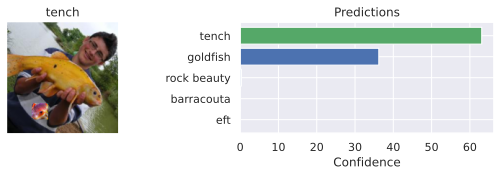

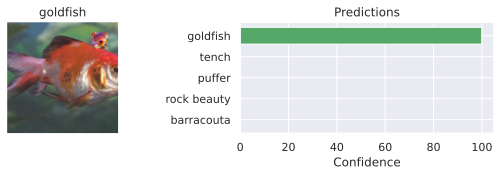

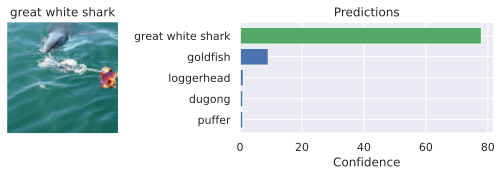

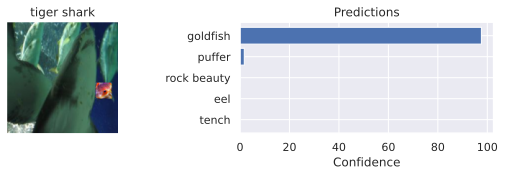

In [ ]:
perform_patch_attack(patch_dict['goldfish'][32]['patch'])

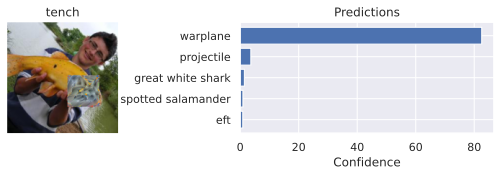

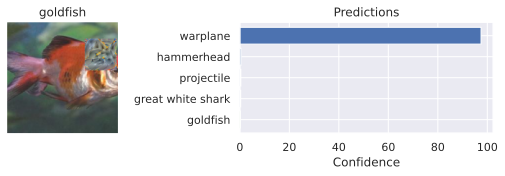

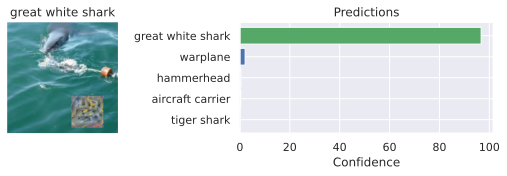

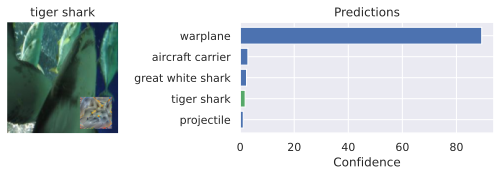

In [ ]:
perform_patch_attack(patch_dict['warplane'][64]['patch'])

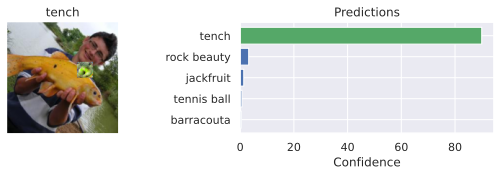

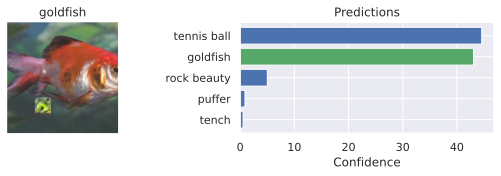

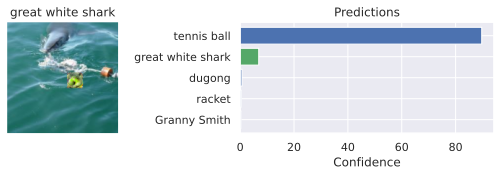

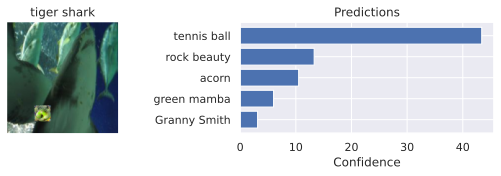

In [ ]:
perform_patch_attack(patch_dict['tennis ball'][32]['patch'])

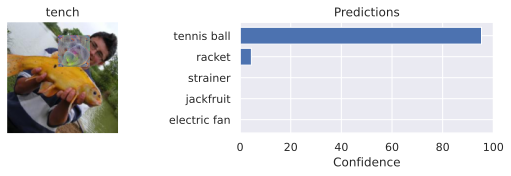

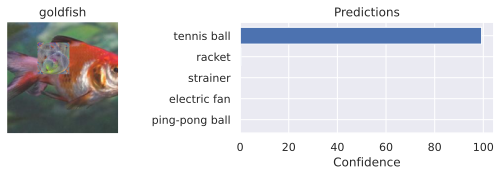

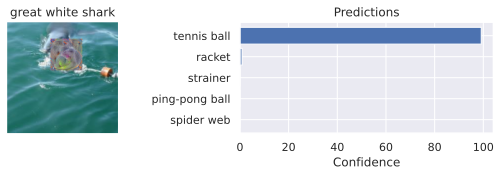

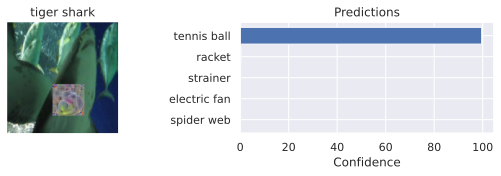

In [ ]:
perform_patch_attack(patch_dict['tennis ball'][64]['patch'])

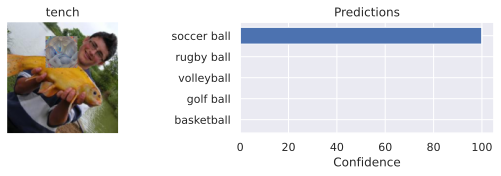

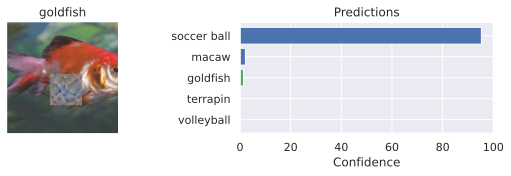

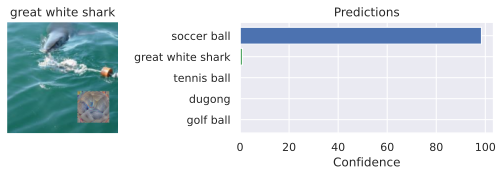

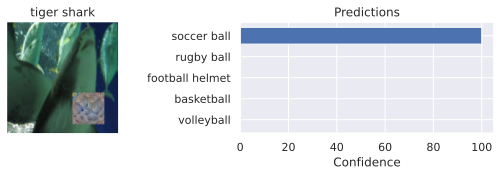

In [ ]:
perform_patch_attack(patch_dict['soccer ball'][64]['patch'])

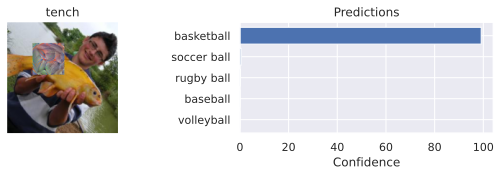

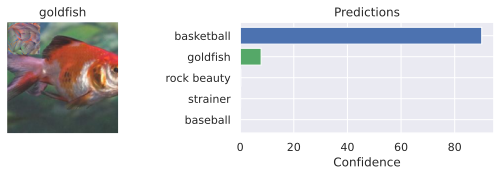

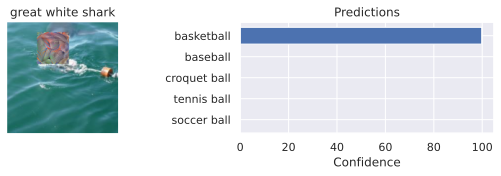

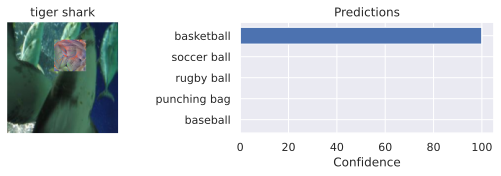

In [ ]:
perform_patch_attack(patch_dict['basketball'][64]['patch'])

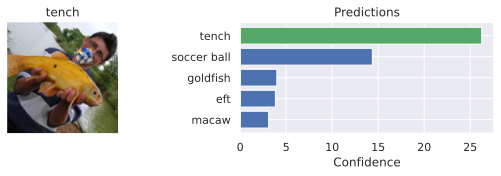

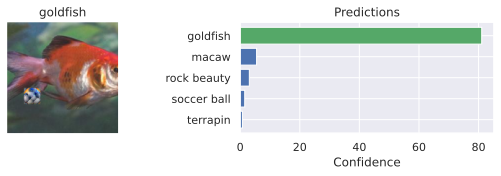

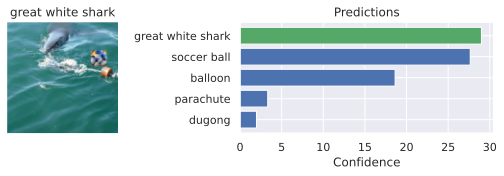

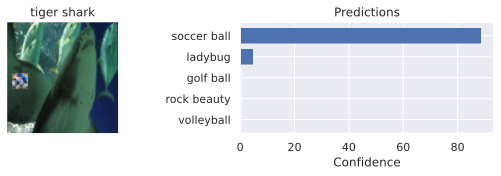

In [ ]:
perform_patch_attack(patch_dict['soccer ball'][32]['patch'])

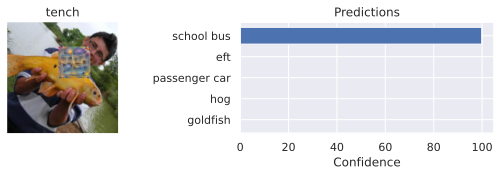

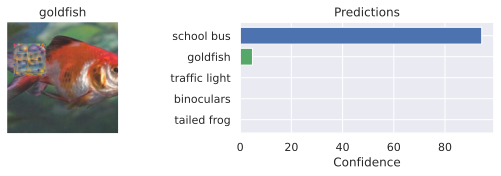

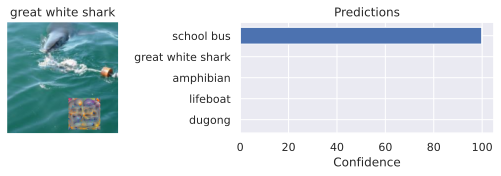

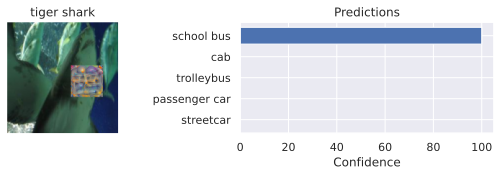

In [ ]:
perform_patch_attack(patch_dict['school bus'][64]['patch'])

## **New Patch Modifications**

I tested combining two patches together (thru blending and concatentation) and adding a circular mask to a patch (making it a circle shape instead of square/rectangle). 

In [ ]:
def combine_patches(p1, p2, method="concat"):
    if method == "concat":
        # side-by-side horizontal concatenation of two patches
        return torch.cat([p1, p2], dim=2)
    elif method == "blend":
        # same size but mix the textures of both patches
        return (p1 + p2) / 2

Here I tested concatenating the soccer and tennis ball patches together. The results were very successful as at least of the top two predictions for each testcase was either a soccer ball or tennis ball. I think concatenating two patches (at least in this case) works since each patch is still preserving its class-defining visual features. It is still easy for the model to see strong signals for incorrect classification.

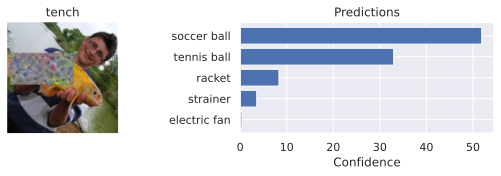

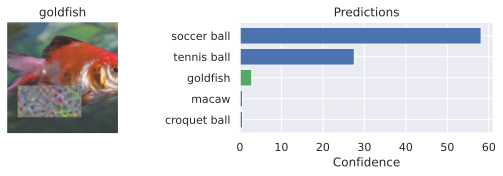

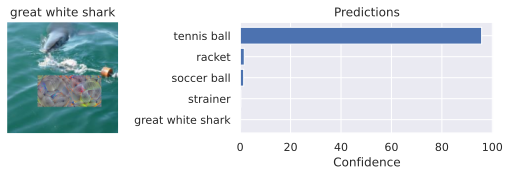

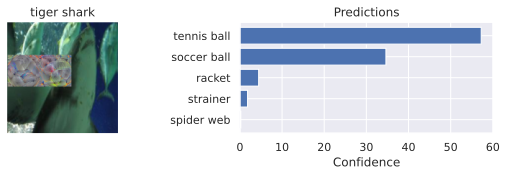

In [18]:
soccer64 = patch_dict['soccer ball'][64]['patch']
tennis64 = patch_dict['tennis ball'][64]['patch']

combined_patch = combine_patches(soccer64, tennis64, method="concat")

perform_patch_attack(combined_patch)

Here I tried blending both patches together (not doubling their size) and the results were not so good on most of the testcases. I think this is because when the patches are blended, the strong visual features from each individual patch get averaged or smeared together. This makes the individual patterns and colors of both patches become less separable, which results in the blended texture not activating either of the class neurons as good as before.

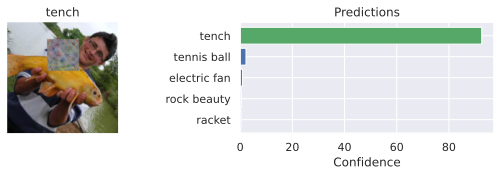

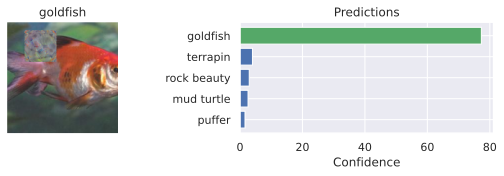

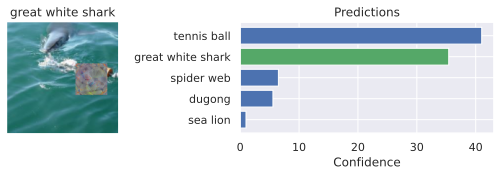

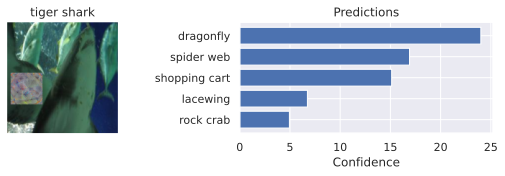

In [21]:
soccer64 = patch_dict['soccer ball'][64]['patch']
tennis64 = patch_dict['tennis ball'][64]['patch']

combined_patch = combine_patches(soccer64, tennis64, method="blend")

perform_patch_attack(combined_patch)

Now I tried adding a circular mask to the patch. This makes the patch look like a circle instead of rectangle. It appears more like a sticker shape (Brown et al.) but I also thought it might help with fooling the model since a soccer ball is naturally a circular shape. I felt that it would help give it a more realistic visual appearance. 

The results below were very good across all testcases. The model also seemed to have other kinds of balls in its top 5 predictions. It is possible that by masking the center in a circle, irrelevant pixels that don't contribute to the class signal are removed (corner parts of the patch). Circularly masking also still keeps the main patterns in the center which likely contribute the most to the model predictions.  

In [ ]:
import random

def place_patch_circular(image, patch):
    # image is a batch of images 
    # patch is just a patch tensor (3, ph, pw)
    B, C, H_img, W_img = image.shape
    _, ph, pw = patch.shape

    # use the same device as the images (cpu or gpu)
    device = image.device

    # normalize the patch to ImageNet range
    patch_img = patch_forward(patch)

    # create the circular mask
    # yy is row indices, xx is column indices 
    yy = torch.arange(ph, device=device).view(ph,1).expand(ph,pw)
    xx = torch.arange(pw, device=device).view(1,pw).expand(ph,pw)

    # center y and center x are the center coordinates of the patch 
    # radius is the radius of the circle mask
    center_y, center_x = (ph-1)/2.0, (pw-1)/2.0
    radius = min(ph,pw)/2.0

    # set 1 for inside the circle and 0 for outside 
    mask = (torch.sqrt((yy-center_y)**2 + (xx-center_x)**2) <= radius).float()
    # expand to 3 channels to match RGB
    mask3 = mask.unsqueeze(0).expand(3, ph, pw)

    out = image.clone()
    
    # go through each image in the test batch 
    for i in range(B):
        # pick a random top left corner on the image to place the patch (similar to original place patch function)
        h_offset = random.randint(0, H_img - ph)
        w_offset = random.randint(0, W_img - pw)

        # extract the region where the patch will go
        # keep the patch pixels inside the circular mask but make the patch pixels outside of the circular mask the original image pixels
        orig = out[i, :, h_offset:h_offset+ph, w_offset:w_offset+pw]
        blended = patch_img * mask3 + orig * (1 - mask3)
        out[i, :, h_offset:h_offset+ph, w_offset:w_offset+pw] = blended

    return out

Modified the original patch attack function to use the circular mask function.

In [ ]:
def perform_circular_patch_attack(patch):
    patch_batch = exmp_batch.clone()
    patch_batch = place_patch_circular(patch_batch, patch)
    with torch.no_grad():
        patch_preds = pretrained_model(patch_batch.to(device))
    for i in range(1,17,5):
        show_prediction(patch_batch[i], label_batch[i], patch_preds[i])

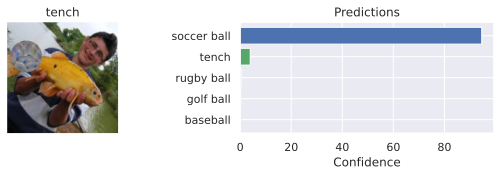

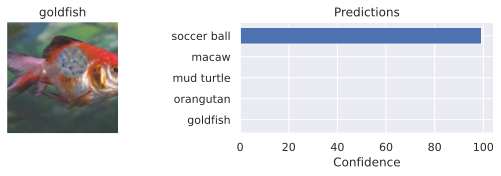

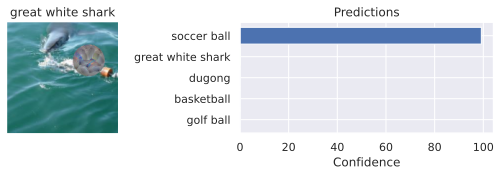

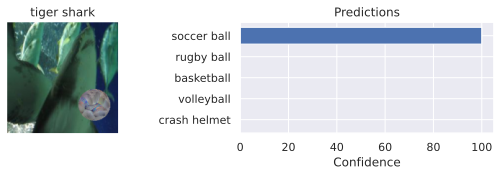

In [ ]:
soccer_patch = patch_dict['soccer ball'][64]['patch']
perform_circular_patch_attack(soccer_patch)

## **Printing Patches**

Each patch was converted and saved as png for printing.

*The patch image lines in the first 3 print code snippets was produced with help from GPT-5 mini on 11/1 at 9:20 P.M.*

**Printed the concatenated tennis and soccer ball patches.**

In [ ]:
import torch
from PIL import Image
import numpy as np

combined_patch = combine_patches(soccer64, tennis64, method="concat")

patch_image = (torch.tanh(combined_patch) + 1.0) / 2.0
patch_image = patch_image.cpu().permute(1,2,0).numpy()
patch_image = (patch_image * 255).astype(np.uint8)

image = Image.fromarray(patch_image)
image.save("combined_patch_concat_print.png", dpi=(300,300))
print("Saved patch as PNG for printing.")

Saved patch as PNG for printing.


**Printed the blended soccer and tennis ball patches.**

In [24]:
import torch
from PIL import Image
import numpy as np

combined_patch = combine_patches(soccer64, tennis64, method="blend")
patch_image = (torch.tanh(combined_patch) + 1.0) / 2.0
patch_image = patch_image.cpu().permute(1,2,0).numpy()
patch_image = (patch_image * 255).astype(np.uint8)

image = Image.fromarray(patch_image)
image.save("combined_patch_blend_print.png", dpi=(300,300))
print("Saved patch as PNG for printing.")

Saved patch as PNG for printing.


**Printed the original soccer ball patch.**

In [ ]:
import torch
from PIL import Image
import numpy as np

patch = patch_dict['soccer ball'][64]['patch']
patch_image = (torch.tanh(patch) + 1.0) / 2.0
patch_image = patch_image.cpu().permute(1,2,0).numpy() 
patch_image = (patch_image * 255).astype(np.uint8)

img = Image.fromarray(patch_image)
img.save("soccer_patch_print.png", dpi=(300,300))
print("Saved patch as PNG for printing.")

Saved patch as PNG for printing.


**Printed the circularly masked soccer ball patch.**

*The lines after the mask (patch_np_rgb to rgba_image_np) in the code snippet below was produced with the help of GPT-5 mini on 11/1 at 9:40 P.M.*

In [ ]:
import torch
import numpy as np
from PIL import Image

patch = patch_dict['soccer ball'][64]['patch']

patch_image = (torch.tanh(patch) + 1.0) / 2.0 
_, ph, pw = patch_image.shape
device = patch_image.device

# create mask as seen earlier in the place_patch_circular function       
yy = torch.arange(ph, device=device).view(ph, 1).expand(ph, pw)
xx = torch.arange(pw, device=device).view(1, pw).expand(ph, pw)
center_y, center_x = (ph - 1) / 2.0, (pw - 1) / 2.0
radius = min(ph, pw) / 2.0
mask = (torch.sqrt((yy - center_y)**2 + (xx - center_x)**2) <= radius).float()

patch_np_rgb = patch_image.cpu().permute(1, 2, 0).numpy() 
patch_np_rgb = (patch_np_rgb * 255).astype(np.uint8)
alpha_channel = (mask.cpu().numpy() * 255).astype(np.uint8) 
rgba_image_np = np.dstack((patch_np_rgb, alpha_channel)) 

image = Image.fromarray(rgba_image_np, 'RGBA')
filename = 'final_circular_patch_transparent.png'
image.save(filename, dpi=(300, 300))

print(f"Successfully saved circular masked patch with transparent background to: {filename}")

Successfully saved circular masked patch with transparent background to: final_circular_patch_transparent.png


/tmp/ipython-input-3861680307.py:47: DeprecationWarning: 'mode' parameter is deprecated and will be removed in Pillow 13 (2026-10-15)
  img = Image.fromarray(rgba_image_np, 'RGBA')
